# 现实中的物体运动

在这一章中，我们将考虑几个涉及实际物体运动的问题。所有的问题都可以通过常微分方程来描述。

这些问题都是涉及宏观物体力学的有趣物理的好例子，这些问题通过分析解决可能有些困难，但可以很容易的用Python来处理。

## 1. 自行车的运动：空气阻力的影响

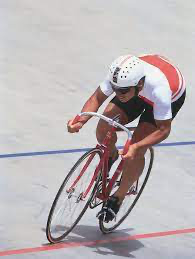

让我们先排除阻力的影响，来讨论自行车的运动。牛顿第二定律告诉我们：
$$
\frac{dv}{dt} = \frac{F}{m}
$$

通常情况下，对力$F$的建模往往十分困难，因为这涉及到人体、自行车传动、以及轮胎和地面的摩擦。而如果我们转而对能量的变化进行分析，会让问题变得更简单。

骑手输出的功率的$P$，等于总能量$E$的变化率：

$$
P = \frac{dE}{dt}
$$

假设总能量$E$只包含动能$E=\frac12 m v^2$(思考一下这么假设的前提是什么？)，我们可以由上式得到：
$$
\frac{dv}{dt} = \frac{P}{mv}
$$

假如$P$是一个常数，这对专业骑手不难，对上式积分,取初始时刻的时间为0，可以得到：
$$
v = \sqrt{v_0^2+2Pt/m}
$$

> 这个结果正确吗？

下面，我们可以从另一个方面数值求解这个常微分方程。

根据导数的定义，我们可以很简单的写出一个求导运算的离散化形式：
$$
\frac{dv}{dt} \approx \frac{v_{i+1} - v_{i}}{\Delta t}
$$

而这一形式是基于我们对时间的离散化：我们用$v_i$表示在时间$t_i$时的速度，而$t_i$定义为时间$i \Delta t$。

基于这样的定义，我们可以把上面的微分方程，写成一个我们之前遇到过的递推形式（回忆一下斐波那契数列）:
$$
v_{i+1} = v_{i} + \frac{P}{mv_i} \Delta t
$$

通过这个形式，我们可以类似的通过对斐波那契数列求解的方法，对这个模型进行求解。我们称这种算法为“欧拉方法”。

理论上，该近似算法的精确度为$\mathcal{O}(\Delta t^2)$。注意，跟算法的复杂度相反，一个优秀的数值积分或者微分的误差显然应该正比于小量的高次幂。

所以，也存在一些所谓的“高阶算法”，他们能够提供更好的数值精度。

然而，作为一门实践课程，我们不会对这些数值算法深度探讨，想知道更多知识请参考一本严肃的计算物理课本。但请大家需要牢记几个事实：

1. 存在很多数值积分算法，他们拥有比欧拉算法更好的精度（比如使误差为$\mathcal{O}(\Delta t^3)$, $\mathcal{O}(\Delta t^4)$， 甚至更好）
2. 我们在这门课里用到欧拉算法的场合，理论上也可以使用那些拥有更高精度的算法求解。
3. 在很多情况下，使用最简单的欧拉方法可以帮助我们快速了解问题的性质。
4. 算法的误差既然正比于$\Delta t$的幂次，这意味着当我们的$\Delta t$越来越小的时候，算法的误差应该越来越接近于0。
   这也意味着我们数值计算的结果应该越来越接近于某个固定的值，而这个值就被认为是真实的物理值。

下面，我们可以尝试使用欧拉方法来求解这个没有摩擦的自行车的运动问题。

我们选取自行车的初始速度为$v_0 = 4 \; \rm m /s$, 车手的输出功率为$P=400 \; \rm w$。那么该怎样选取$\Delta t$呢？


对模拟步长（在这里是$\Delta t$）的选取是一个十分经典的问题，在数值计算中，我们通常选取我们的步长$\Delta t$为一个相对于研究系统的“特征时间”的小量。

而特征时间的确定并不是很容易。事实上，一个很有用的方法，是不断使用越来越小的步长，进行多次模拟，观察结果是否呈现收敛性。


> 通过让某个值不断趋近于一个不可能达到的极限，从而对物理规律进行探究，我们之前是否学习过这类研究手段？

在这里，我们简单的选取$\Delta t = 1s$就足够了。让我们写一个函数来进行计算：

In [1]:
# 计算无摩擦自行车的速度
import numpy as np
def bicy_vel_frictless(v0, dt=1, nt=200, P=400, m=85):
    vels = []
    vels.append(v0)
    for it in range(nt-1):
        vels.append(vels[it] + P/(m * vels[it]) * dt)
    return np.array(vels)

In [2]:
vels_frictless = bicy_vel_frictless(4)

我们成功利用Python，使用最简单的欧拉方法，计算了速度关于时间的函数。下面我们尝试利用画图工具，直观的把这一函数呈现出来。

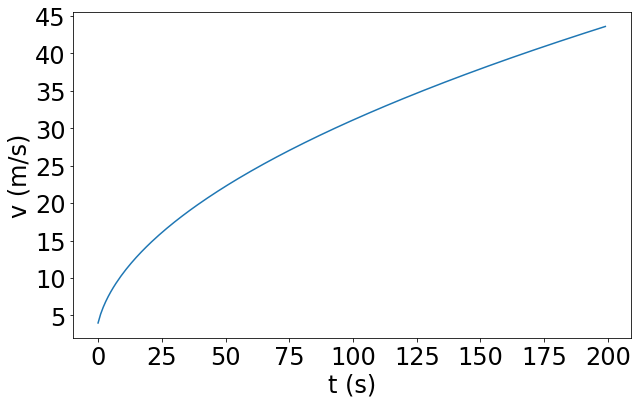

In [3]:
# 引入 matplotlib包的pyplot子module
import matplotlib.pyplot as plt

# 调整图片的大小
plt.figure(figsize=(10,6))

# 用法：plt.plot(x, y)
t = np.arange(200) * 1
plt.plot(t, vels_frictless)

# 加入x轴标记
plt.xlabel('t (s)', fontsize=24)
# 加入y轴标记
plt.ylabel('v (m/s)', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.show()

我们可以在这里加一条线，它代表了我们之前得到的解析解，来验证一下我们数值解的正确性。

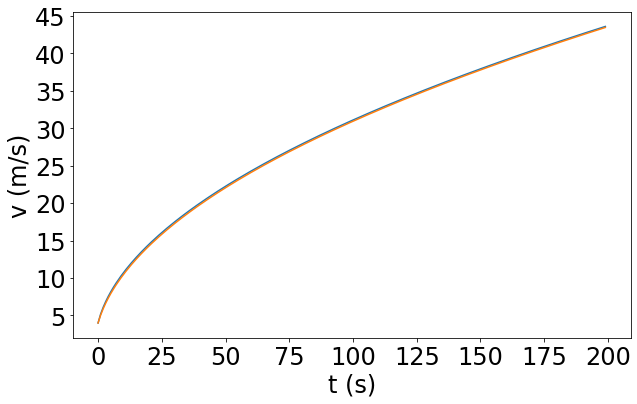

In [4]:
# 调整图片的大小
plt.figure(figsize=(10,6))

# 用法：plt.plot(x, y)
t = np.arange(200) * 1
plt.plot(t, vels_frictless)
plt.plot(t, np.sqrt(4**2 + 2 * 400 * t / 85))

# 加入x轴标记
plt.xlabel('t (s)', fontsize=24)
# 加入y轴标记
plt.ylabel('v (m/s)', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.show()

通过对结果的可视化，我们很快会发现这个结果的不合理之处：车手的速度在3分钟之内超过了$40\; \rm m/s$，即$144\; \rm km/h$。这已经可以赶得上汽车了！

因此，该建模显然存在问题，这提示我们必须引入一些阻止车手运动的力。而对于阻力的建模，往往十分复杂。解决这一类复杂的问题，一个很有用的技巧就是：我们可以考虑这个复杂的力跟哪些我们已知的物理量相关。

> 回忆一下我们在其他物理学科里是否也使用过相关技巧？

通过对日常生活经验的总结，我们可以简单的假设，阻力可能与速度及速度的平方有关，这意味着我们可以假设
$$
F_{\rm drag} \approx - B_1 v - B_2 v^2
$$

其中，第一项类似于斯托克斯定律（Stokes law），描述了球形物体在流体中所受到的阻力。但现实中，对于自行车速度的物体，因为速度较大，第二项$B_2 v^2$ 往往占据阻力的主导成分。

而我们可以先尝试通过量纲分析，写出$B_2$的形式。

对于空气阻力，$B_2$大概率与空气密度，以及迎风面积$A$有关。根据量纲分析，我们立刻可以得到
$$
F_{drag} \propto \rho A v^2
$$

当然，我们也可以更严谨一些。我们可以试着想象这样一种场景，物体在空气中运动会不断把空气推开。

在$dt$时间内，推开的空气质量大致为自行车迎风面$A$扫过的体积乘空气密度，即：

$$
m_{\rm air} \approx  \rho A v dt
$$
而在推开空气之后，这一部分的空气大致会得到一个大小为$\frac 12 m_{\rm air} v^2$的动能。而这个动能应该等于空气阻力做的功：$F_{\rm drag} v dt$。因此，我们可以得到
$$
F_{\rm drag} \approx -\frac12 C \rho A v^2,
$$
而$C$为空气阻力系数。

有了这个新的阻力项之后，我们直接将此项加入到我们的欧拉算法中去：
$$
v_{i+1} = v_{i} + \frac{P}{mv_i} \Delta t -\frac{ C \rho A v_i^2 \Delta t}{2m}.
$$

In [5]:
# 计算考虑空气阻力时自行车的速度
def bicy_vel_fric(v0, dt=1, nt=200, P=400, m=85, rho=1.29, A=0.3, C=1):
    vels = []
    vels.append(v0)
    for it in range(nt-1):
        vels.append(vels[it] + P/(m * vels[it]) * dt - C * rho * A * vels[it]**2 * dt / (2 * m))
    return np.array(vels)

In [6]:
vels_frict = bicy_vel_fric(4, C=1)

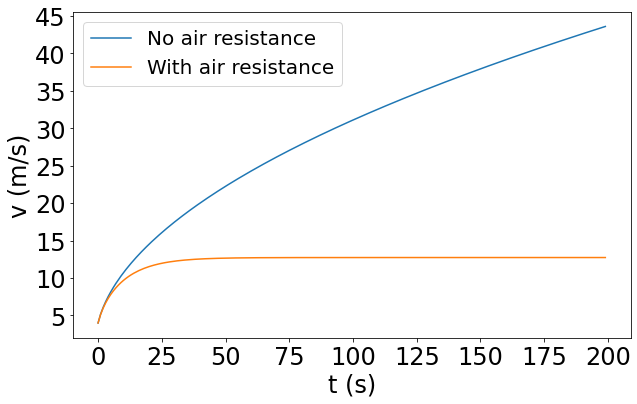

In [7]:
# 调整图片的大小
plt.figure(figsize=(10,6))

# 用法：plt.plot(x, y)
t = np.arange(200) * 1
plt.plot(t, vels_frictless)
plt.plot(t, vels_frict)
# 加入x轴标记
plt.xlabel('t (s)', fontsize=24)
# 加入y轴标记
plt.ylabel('v (m/s)', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

plt.legend(['No air resistance', 'With air resistance'], fontsize=20)
plt.show()

$13\; \rm m/s$的最大速度是一个合理的估值！

这样的物理建模，甚至可以帮助我们对棋手的比赛策略进行分析。例如，我们可以通过画图，尝试分析增加$20\%$的功率和减小$20\%$的风阻系数，哪种方式对提高速度更有利。

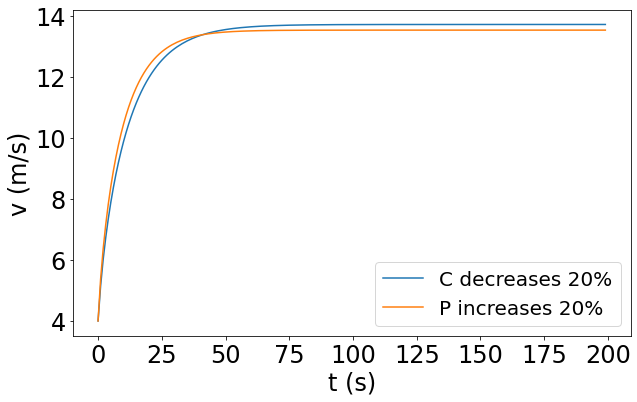

In [8]:
# 调整图片的大小
plt.figure(figsize=(10,6))

# 用法：plt.plot(x, y)
t = np.arange(200) * 1
# 减小20%的风阻系数
plt.plot(t, bicy_vel_fric(4, C=1*0.8))
# 增大20%的输出功率
plt.plot(t, bicy_vel_fric(4, P=400*1.2))
# 加入x轴标记
plt.xlabel('t (s)', fontsize=24)
# 加入y轴标记
plt.ylabel('v (m/s)', fontsize=24)

plt.legend([ 'C decreases 20%','P increases 20%'], fontsize=20)


plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.show()


## 2. 二维抛物运动

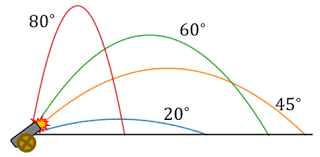

我们之前学习到的欧拉方法，可以被很简单的拓展到一个2维运动中。暂时忽略空气阻力，我们可以考虑如下的2维抛物运动方程：
$$
\begin{eqnarray}
\frac{dx^2}{dt^2} &=& 0 \\
\frac{dy^2}{dt^2} &=& -g
\end{eqnarray}
$$

对于这样的二阶常微分方程组，为了使用我们之前学习到过的欧拉方法，我们可以把他们简化成4个一维方程：

$$
\begin{eqnarray}
\frac{dx}{dt} &=& v_x \\
\frac{dv_x}{dt} &=& 0 \\
\frac{dy}{dt} &=& v_y \\
\frac{dv_y}{dt} &=& -g
\end{eqnarray}
$$

使用欧拉方法，我们可以把这四个微分方程写成离散化的形式。即：
$$
\begin{eqnarray}
x_{i+1} &=& x_i + v_{x,i}\Delta t\\
v_{x,i+1} &=& v_{x,i} \\
y_{i+1} &=& y_i + v_{y, i} \Delta t \\
v_{y, i+1} &=& v_{y, i} - g\Delta t
\end{eqnarray}
$$

有了这样的递推方程之后，我们只需要给丁一个初始的$(x, y, v_x, v_y)$数据，就可以计算随后任意时刻的炮弹位置和数据。

当然，对于炮弹的运动，考虑空气阻力也是十分必要的。但需要注意的是，在这个问题中，空气阻力一般认为应平行于炮弹运动方向，所以类似于我们对速度的分解，空气阻力也应该进行相应的分解。其中，$x$方向的空气阻力可以写为

$$
F_{\rm drag, x} = F_{\rm drag} \cos \theta = F_{\rm drag} \cdot (v_x / v)
$$


带入我们之前得到的空气阻力表达式$F_{\rm drag} \approx -\frac12 C \rho A v^2$，我们可得：

$$
\begin{eqnarray}
F_{\rm drag, x} &=& -\frac12 C \rho A v v_x \\ 
F_{\rm drag, y} &=& -\frac12 C \rho A v v_y \\ 
\end{eqnarray}
$$

所以，类似的，我们可以得到包含空气阻力的离散化的抛物方程：

$$
\begin{eqnarray}
x_{i+1} &=& x_i + v_{x,i}\Delta t\\
v_{x,i+1} &=& v_{x,i} - \frac{1}{2m} C \rho A v_i v_{x,i} \Delta t\\
y_{i+1} &=& y_i + v_{y, i} \Delta t \\
v_{y, i+1} &=& v_{y, i} - g\Delta t - \frac{1}{2m} C \rho A v_i v_{y,i} \Delta t
\end{eqnarray}
$$

因此，类似的我们也可以写出一个计算炮弹轨迹的函数

In [9]:
# 计算炮弹轨迹
import numpy as np
def cannon(v0=700, theta0=45, dt=0.1, m=100, rho=1.29, A=0.1, C=1):
    x, y, vx, vy = [], [], [], []
    
    x.append(0)
    y.append(0)
    vx.append(v0 * np.cos(np.deg2rad(theta0)))
    vy.append(v0 * np.sin(np.deg2rad(theta0)))
    
    while(y[-1] >= 0):
        x.append(x[-1] + vx[-1] * dt)
        y.append(y[-1] + vy[-1] * dt)

        v = np.sqrt(vx[-1]**2 + vy[-1]**2)
        
        vx.append(vx[-1] - C * rho * A * (vx[-1] * v) * dt / (2 * m))
        vy.append(vy[-1] -9.8 * dt - C * rho * A * (vy[-1] * v) * dt / (2 * m))

    return (x, y, vx, vy)

首先我们想看看没有风阻时的炮弹轨迹，并且想要观察轨迹随着角度的变化。


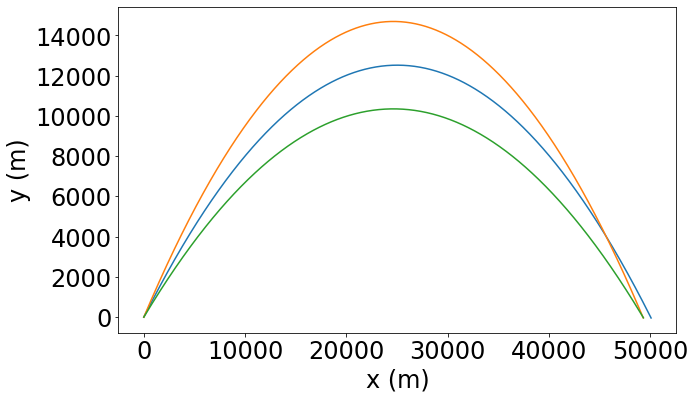

In [10]:
x1, y1, vx1, vy1 = cannon(theta0=45, C=0)
x2, y2, vx2, vy2 = cannon(theta0=50, C=0)
x3, y3, vx3, vy3 = cannon(theta0=40, C=0)

# 调整图片的大小
plt.figure(figsize=(10,6))

# 画出轨迹
plt.plot(x1, y1)
plt.plot(x2, y2)
plt.plot(x3, y3)

# 加入x轴标记
plt.xlabel('x (m)', fontsize=24)
# 加入y轴标记
plt.ylabel('y (m)', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.show()

有风阻时，情况完全不同

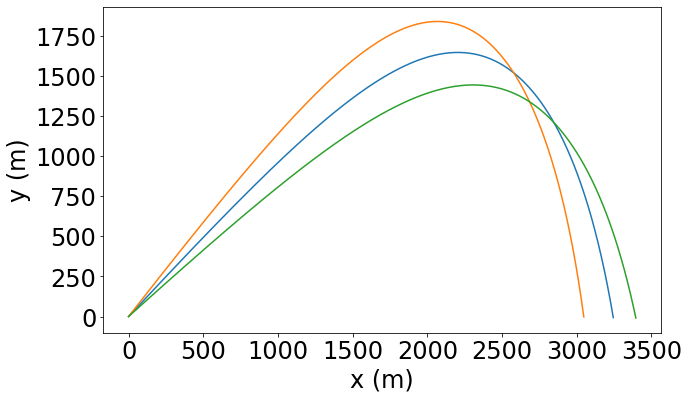

In [11]:
x1, y1, vx1, vy1 = cannon(theta0=45, C=1)
x2, y2, vx2, vy2 = cannon(theta0=50, C=1)
x3, y3, vx3, vy3 = cannon(theta0=40, C=1)

# 调整图片的大小
plt.figure(figsize=(10,6))

# 画出轨迹
plt.plot(x1, y1)
plt.plot(x2, y2)
plt.plot(x3, y3)

# 加入x轴标记
plt.xlabel('x (m)', fontsize=24)
# 加入y轴标记
plt.ylabel('y (m)', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.show()

对于炮弹的二维运动，还有一点需要注意，那就是炮弹飞行的高度很高。而空气阻力的大小正比空气密度。在高空中，空气的密度（压强）将相应的变化（回忆一下热学的内容）。

对于理想气体，其密度和高度的关系可由以下表达式大致描述：
$$
\rho = \rho_0 \exp(-y/H)，
$$
其中$H$就是所谓的“大气标高” $H=k_B T / mg \approx 9000 m$。

> 思考如何将大气密度修正带入到我们的计算中

## 3. 旋转球体的抛物运动

我们已经知道空气阻力大致和速度的平方成正比例关系: $F_{\rm drag} \sim v^2$。从这点出发可以得到一些很有趣的结论，比如一个绕着垂直于速度方向逆时针旋转的球体（如图）。其下端相对于空气的速度要大于上端相对于空气的速度，且由上缘总体受阻力向下，而下半部总体受到向上的阻力。综合起来会得到一个净向上的合力。（这与我们打乒乓球或者踢足球得到的经验相符合）。这种力我们也称为马格努斯力（Magnus force）。

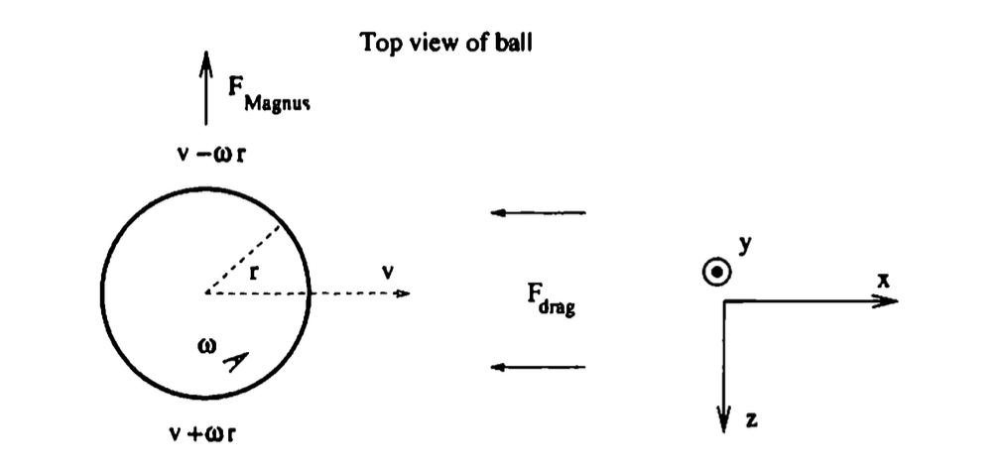

即使是对于一个光滑球体，对马格努斯力的计算也涉及到球面上力的积分。在这门课例，我们将不去精确计算而是对力的形式进行分析，因为最终我们总需要求助于实验来确定未知系数。

考虑到空气阻力和速度存在平方的关系，我们可以猜想马格努斯力与球体顶端和低端的速度差的平方有关，即：
$$
F_M \propto (v + r\omega)^2 - (v - r\omega)^2 \sim vr \omega
$$

如果我们吸收掉作为常数的$r$，我们可以加入一个具有质量量纲的待定系数$S_0$来凑成力的量纲
$$
F_M = S_0\omega v_x
$$

下面让我们针对一个具体的例子----棒球来进行分析。
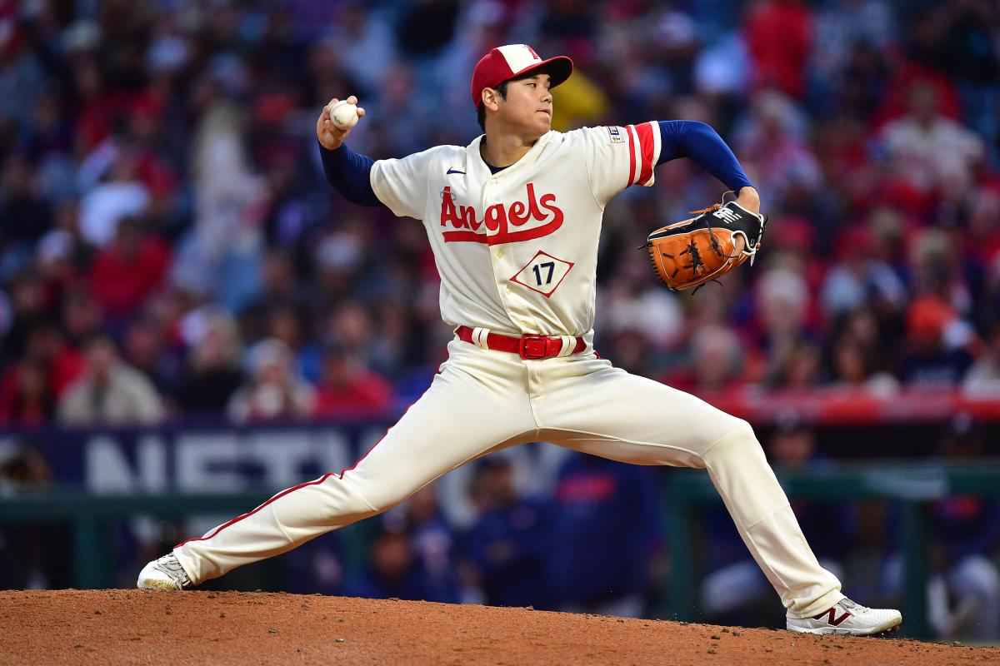

和之前介绍的炮弹稍微有点不同，棒球几乎进行的是一种横向飞行，$y$方向上的速度相对较小。因此，我们可以忽略$y$方向上的空气阻力，使用欧拉方法，写出考虑旋转时棒球飞行的离散化方程：

$$
\begin{eqnarray}
x_{i+1} &=& x_i + v_{x,i}\Delta t\\
v_{x,i+1} &=& v_{x,i} - \frac{1}{2m} C \rho A v_i v_{x,i} \Delta t\\
y_{i+1} &=& y_i + v_{y, i} \Delta t \\
v_{y, i+1} &=& v_{y, i} - g\Delta t \\
z_{i+1} &=& z_i + z_{y, i} \Delta t \\
v_{z, i+1} &=& v_{z, i} - \frac{S_0}{m} v_{x, i} \omega \Delta t 
\end{eqnarray}
$$

我们可以进一步假设$S_0 /m $为一个无量纲常数, 对于以$40\; \rm km/h $至$120 \; \rm km/h$飞行的棒球来说，这个值大约为$S_0/m\approx 3.1 \times 10^{-4}$。我们可以基于同样的方法，写出下面这个函数

In [25]:
# 计算棒球轨迹
import numpy as np
def baseball(v0=100, theta0=0, dt=0.01, m=0.15, S0=0.15*4.1e-4, rho=1.29, A=0.017, C=0.5, omega=2*np.pi*20):
    x, y, z, vx, vy, vz = [], [], [], [], [], []
    
    x.append(0)
    y.append(0)
    z.append(0)
    vx.append(v0 * np.cos(np.deg2rad(theta0)))
    vy.append(v0 * np.sin(np.deg2rad(theta0)))
    vz.append(0)
    
    while(x[-1] < 18):
        x.append(x[-1] + vx[-1] * dt)
        y.append(y[-1] + vy[-1] * dt)
        z.append(z[-1] + vz[-1] * dt)
        
        v = np.sqrt(vx[-1]**2 + vy[-1]**2 + vz[-1]**2)
        
        vx.append(vx[-1] - C * rho * A * (vx[-1] * v) * dt / (2 * m))
        vy.append(vy[-1] + 9.8 * dt )
        vz.append(vz[-1] - S0 / m * vx[-1] * omega * dt )

    return (x, y, z, vx, vy, vz)

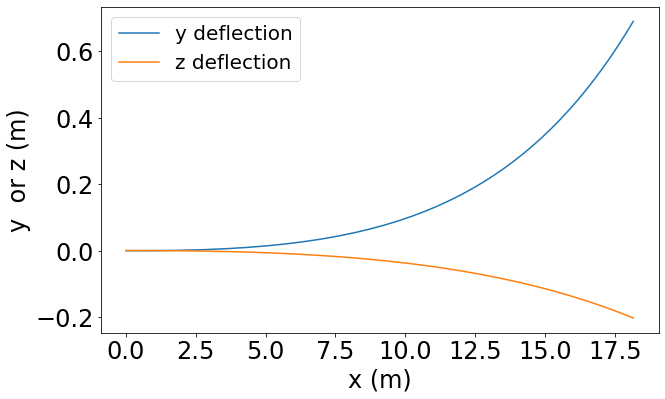

In [26]:
x1, y1, z1, vx1, vy1, vz1 = baseball(theta0=0, C=1)

# 调整图片的大小
plt.figure(figsize=(10,6))

# 画出轨迹
plt.plot(x1, y1)
plt.plot(x1, z1)

# 加入x轴标记
plt.xlabel('x (m)', fontsize=24)
# 加入y轴标记
plt.ylabel('y  or z (m)', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

plt.legend(['y deflection', 'z deflection'], fontsize=20)


plt.show()

然而，在现实中的球类运动中，往往有这样一类球，他们几乎不旋转。在棒球里叫“蝴蝶球”，在足球里叫“电梯球”、“落叶球”。尽管他们旋转的非常慢，但往往会呈现出难以预判的轨迹。这该如何解释？

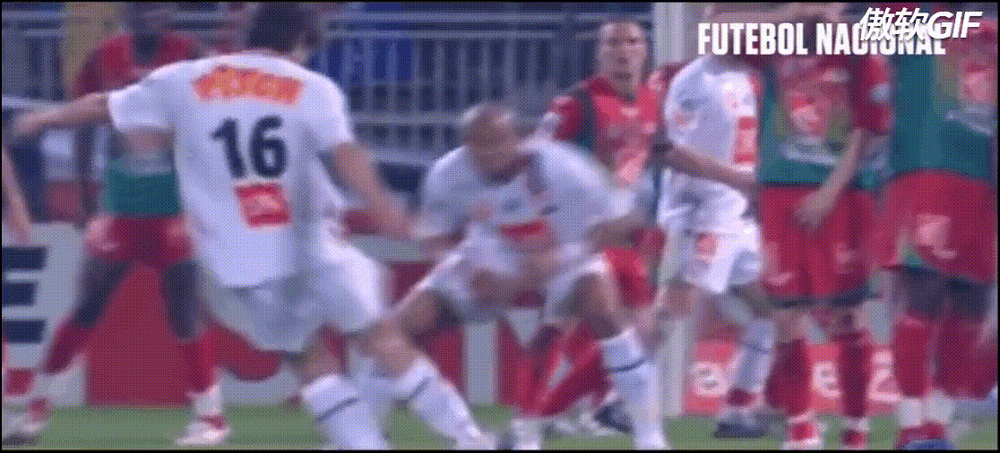

事实上，由于制作工艺的限制，我们可以制作的足球或者棒球都不会是一个完美的球形。他们的表面一定会存在一些粗糙的结合部位。而根据表面的粗糙程度不同，其受到的空气阻力也会略有不同（体现在阻力系数C的不同）。

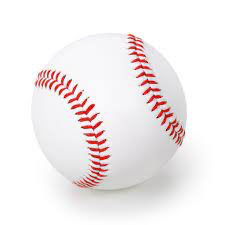

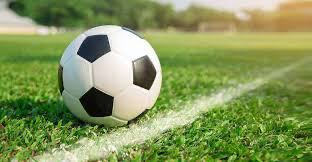

假设一个完全不旋转的球，其上端正好对应了球体的平滑部分，而下端正好对应了球体的粗糙部分，这两端就会产生不一样的阻力系数，从而产生了一个等效的马格努斯力，但由于原理不同，我们一般称这种力为侧向力（lateral force）。

这种由表面的不平滑性导致的力，最好的估计方式依然是实际测量。通过风洞测量，我们给出了一个不旋转的棒球在不同朝向时所受到的侧向力。

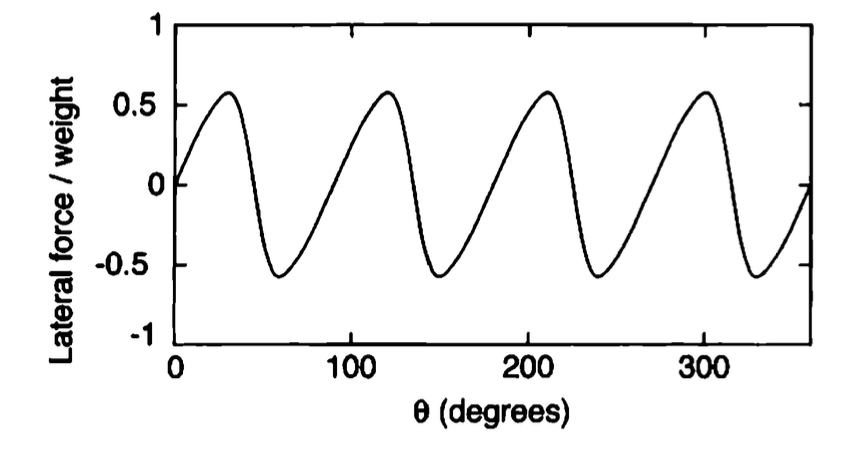

我们可以对这样的测量结果做如下的拟合：

$$
\frac{F_{\rm lateral}}{mg} = 0.5 [\sin (4\theta) - 0.25 \sin(8\theta) + 0.08 \sin(12\theta) - 0.025 \sin(16\theta)]
$$

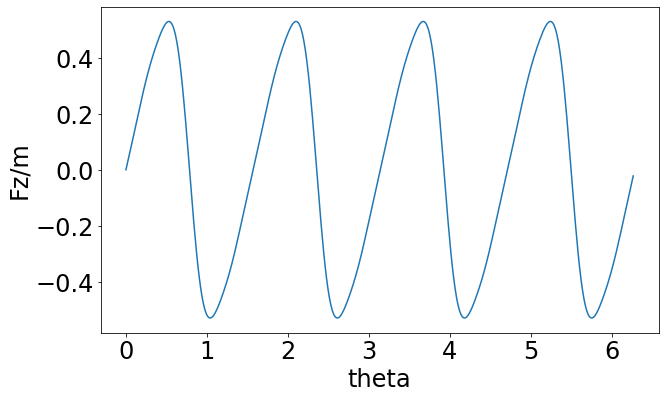

In [14]:
theta = np.deg2rad(np.arange(0,360))
F = 0.5 * (np.sin(4 * theta) - 0.25 * np.sin(8 * theta) + 0.08 * np.sin(12 * theta) - 0.025 * np.sin(16 * theta))

# 调整图片的大小
plt.figure(figsize=(10,6))

# 画出轨迹
plt.plot(theta, F)

# 加入x轴标记
plt.xlabel('theta', fontsize=24)
# 加入y轴标记
plt.ylabel('Fz/m', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

plt.show()

如果对于一个完美的不会旋转的球体，即使上图的侧向力与朝向之间的关系成立，该球体也只会受到一个恒定的力。但如果该球体具有一个非常小的角速度，以至于由旋转产生的马格努斯力可以被忽略。这时，侧向力会主导球体的在垂直于运动方向上的运动，从而可能产生落叶球、蝴蝶球的效果。

为了量化这种侧向力，我们必须再引入一个变量，那就是当前球体朝向的角度$\alpha$，它等于

$$
\alpha_{i+1} = \alpha_{i} + \omega \Delta t. 
$$

我们写出下面这个函数来计算：

In [15]:
# 计算棒球考虑侧向力的轨迹
import numpy as np
def baseball(v0=100, theta0=0, dt=0.01, m=0.15, S0=0.15*4.1e-4, rho=1.29, A=0.017, C=1, omega=2*np.pi*0.2, alpha0=0):
    x, y, z, alpha, vx, vy, vz = [], [], [], [], [], [], []
    
    x.append(0)
    y.append(1.6)
    z.append(0)
    alpha.append(alpha0)
    vx.append(v0 * np.cos(np.deg2rad(theta0)))
    vy.append(v0 * np.sin(np.deg2rad(theta0)))
    vz.append(0)
    
    while(x[-1] < 18):
        x.append(x[-1] + vx[-1] * dt)
        y.append(y[-1] + vy[-1] * dt)
        z.append(z[-1] + vz[-1] * dt)
        
        
        v = np.sqrt(vx[-1]**2 + vy[-1]**2 + vz[-1]**2)
        
        vx.append(vx[-1] - C * rho * A * (vx[-1] * v) * dt / (2 * m))
        vy.append(vy[-1] - 9.8 * dt )
        vz.append(vz[-1] - S0 / m * vx[-1] * omega * dt 
                 + 0.5 * (np.sin(4 * alpha[-1]) - 0.25 * np.sin(8 * alpha[-1]) + 0.08 * np.sin(12 * alpha[-1]) - 0.025 * np.sin(16 * alpha[-1])) * dt * 9.8)
        alpha.append(alpha[-1] + omega * dt)


    return (x, y, z, vx, vy, vz, alpha)

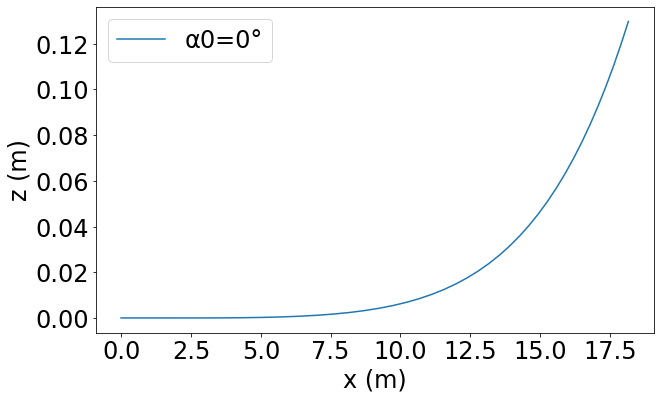

In [16]:
import matplotlib.pyplot as plt
x1, y1, z1, vx1, vy1, vz1,alpha1 = baseball(theta0=0, alpha0=0.65)
x2, y2, z2, vx2, vy2, vz2,alpha2 = baseball(theta0=0, alpha0=0)

# 调整图片的大小
plt.figure(figsize=(10,6))

# 画出轨迹
#plt.plot(x1, z1)
plt.plot(x2, z2)

# 加入x轴标记
plt.xlabel('x (m)', fontsize=24)
# 加入y轴标记
plt.ylabel('z (m)', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

plt.legend(['α0=0°'], fontsize=24)


plt.show()

In [17]:
np.rad2deg(0.55)

31.51267873219528

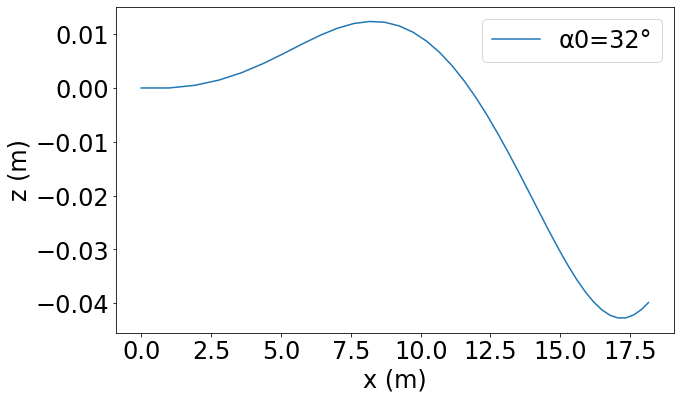

In [18]:
import matplotlib.pyplot as plt
x1, y1, z1, vx1, vy1, vz1,alpha1 = baseball(theta0=0, omega=2*np.pi*0.75, alpha0=0)
x2, y2, z2, vx2, vy2, vz2,alpha2 = baseball(theta0=0, omega=2*np.pi*0.75, alpha0=0.55)

# 调整图片的大小
plt.figure(figsize=(10,6))

# 画出轨迹
#plt.plot(x1, z1)
plt.plot(x2, z2)

# 加入x轴标记
plt.xlabel('x (m)', fontsize=24)
# 加入y轴标记
plt.ylabel('z (m)', fontsize=24)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

plt.legend(['α0=32°'], fontsize=24)


plt.show()